# Wireless Repeater Detection Simulation

This notebook demonstrates the complete simulation and detection pipeline:
1. Generate BTS and unauthorized repeaters
2. Simulate drive test measurements with Friis equation
3. Detect repeaters using statistical anomaly detection
4. Visualize results on interactive maps

## Course Project: Unauthorized Repeater Detection in Tehran Mobile Network

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Import project modules
import pkg.config as config
from pkg.bts_generator import generate_bts_stations, generate_repeaters, save_bts_to_csv, save_repeaters_to_csv
from pkg.drive_test_simulator import simulate_drive_test
from pkg.detection import detect_repeaters, validate_detection, build_expected_coverage_map, calculate_residuals
from pkg.visualization import create_main_detection_map, create_comparison_maps, plot_residual_histogram, plot_detection_metrics

print("All modules loaded successfully!")

Matplotlib is building the font cache; this may take a moment.


All modules loaded successfully!


## Step 1: Generate BTS Network and Unauthorized Repeaters

In [ ]:
# Generate BTS stations
print("Generating BTS stations...")
bts_stations = generate_bts_stations(
    num_bts=8,
    random_seed=42
)

# Save to CSV
save_bts_to_csv(bts_stations)

# Display BTS info
bts_df = pd.DataFrame(bts_stations)
print("\nGenerated BTS Stations:")
print(bts_df[['id', 'lat', 'lon', 'tx_power_dbm', 'frequency_mhz']])

Generating BTS stations...
Generated 8 BTS stations
Saved 8 BTS to ./data/bts_stations.csv

Generated BTS Stations:
        id        lat        lon  tx_power_dbm  frequency_mhz
0  BTS_001  35.649890  51.580286            43           1800
1  BTS_002  35.735679  51.439463            43           1800
2  BTS_003  35.597444  51.262398            43           1800
3  BTS_004  35.573940  51.546470            43           1800
4  BTS_005  35.704268  51.483229            43           1800
5  BTS_006  35.564940  51.587964            43           1800
6  BTS_007  35.759786  51.284936            43           1800
7  BTS_008  35.633018  51.409903            43           1800


In [3]:
# Generate unauthorized repeaters
print("Generating unauthorized repeaters...")
repeaters = generate_repeaters(
    bts_list=bts_stations,
    num_repeaters=2,
    random_seed=43
)

# Save to CSV
save_repeaters_to_csv(repeaters)

# Display repeater info
repeater_df = pd.DataFrame(repeaters)
print("\nGenerated Unauthorized Repeaters:")
print(repeater_df[['id', 'lat', 'lon', 'gain_db', 'serving_bts_id']])

Generating unauthorized repeaters...
Generated 2 unauthorized repeaters
Saved 2 repeaters to ./data/repeaters.csv

Generated Unauthorized Repeaters:
        id        lat        lon  gain_db serving_bts_id
0  REP_001  35.683472  51.483724       70        BTS_005
1  REP_002  35.599032  51.294748       70        BTS_003


## Step 2: Simulate Drive Test Measurements

Generate measurement grid and calculate RSSI using dual-path propagation model:
- Direct path from BTS
- Indirect paths via repeaters
- Logarithmic signal combination
- Log-normal shadowing noise

In [4]:
# Run drive test simulation
print("Running drive test simulation...")
measurements = simulate_drive_test(
    bts_list=bts_stations,
    repeater_list=repeaters,
    add_noise=True,
    save_to_csv=True
)

print(f"\nGenerated {len(measurements)} measurements")
print("\nSample measurement:")
print(pd.DataFrame([measurements[0]]))

Running drive test simulation...
Generated 392288 measurement points (grid spacing: 50m)
Simulating drive test with 392288 measurement points...
BTS: 8, Repeaters: 2
Noise: enabled (sigma=8 dB)
Processed 1000/392288 points...
Processed 2000/392288 points...
Processed 3000/392288 points...
Processed 4000/392288 points...
Processed 5000/392288 points...
Processed 6000/392288 points...
Processed 7000/392288 points...
Processed 8000/392288 points...
Processed 9000/392288 points...
Processed 10000/392288 points...
Processed 11000/392288 points...
Processed 12000/392288 points...
Processed 13000/392288 points...
Processed 14000/392288 points...
Processed 15000/392288 points...
Processed 16000/392288 points...
Processed 17000/392288 points...
Processed 18000/392288 points...
Processed 19000/392288 points...
Processed 20000/392288 points...
Processed 21000/392288 points...
Processed 22000/392288 points...
Processed 23000/392288 points...
Processed 24000/392288 points...
Processed 25000/392288 

## Step 3: Detect Unauthorized Repeaters

Detection pipeline:
1. Build expected coverage map (without repeaters)
2. Calculate residuals (actual - predicted)
3. Statistical anomaly detection (z-score)
4. Spatial clustering (DBSCAN)
5. Repeater localization (weighted centroid)

In [5]:
# Run detection algorithm
detected_repeaters = detect_repeaters(
    measurements=measurements,
    bts_list=bts_stations
)

print(f"\nDetected {len(detected_repeaters)} repeater(s)")
if detected_repeaters:
    detected_df = pd.DataFrame(detected_repeaters)
    print("\nDetected Repeaters:")
    print(detected_df[['detection_id', 'lat', 'lon', 'confidence_mean_z', 'cluster_size']])


REPEATER DETECTION PIPELINE
Building expected coverage map (without repeaters)...
Generated predictions for 392288 points
Calculating residuals (actual - predicted)...
Detecting anomalies using z-score threshold: 2.5
Residual statistics: mean=0.00 dB, std=8.01 dB
Detected 19215 anomalous measurement points
Clustering anomalies with DBSCAN (eps=500m, min_samples=10)...
Found 3 anomaly clusters

Localizing repeaters for 3 clusters...

Detected Repeater #1:
  Location: (35.564123, 51.208779)
  Confidence (mean z-score): 2.88
  Cluster size: 24 points

Detected Repeater #0:
  Location: (35.679828, 51.398853)
  Confidence (mean z-score): 2.83
  Cluster size: 19057 points

Detected Repeater #2:
  Location: (35.641493, 51.596841)
  Confidence (mean z-score): 2.73
  Cluster size: 10 points

DETECTION COMPLETE: 3 repeaters detected


Detected 3 repeater(s)

Detected Repeaters:
  detection_id        lat        lon  confidence_mean_z  cluster_size
0   DETECTED_1  35.564123  51.208779           2

## Step 4: Validate Detection Results


DETECTION VALIDATION

Detected Repeater: DETECTED_1
  Detected at: (35.564123, 51.208779)
  Actual at:   (35.599032, 51.294748)
  Error: 8701.5 meters
  Confidence: 2.88

Detected Repeater: DETECTED_0
  Detected at: (35.679828, 51.398853)
  Actual at:   (35.683472, 51.483724)
  Error: 7693.5 meters
  Confidence: 2.83

Detected Repeater: DETECTED_2
  Detected at: (35.641493, 51.596841)
  Actual at:   (35.683472, 51.483724)
  Error: 11251.7 meters
  Confidence: 2.73

Detection Rate: 150.0% (3/2)
Mean Error: 9215.6 meters
Median Error: 8701.5 meters



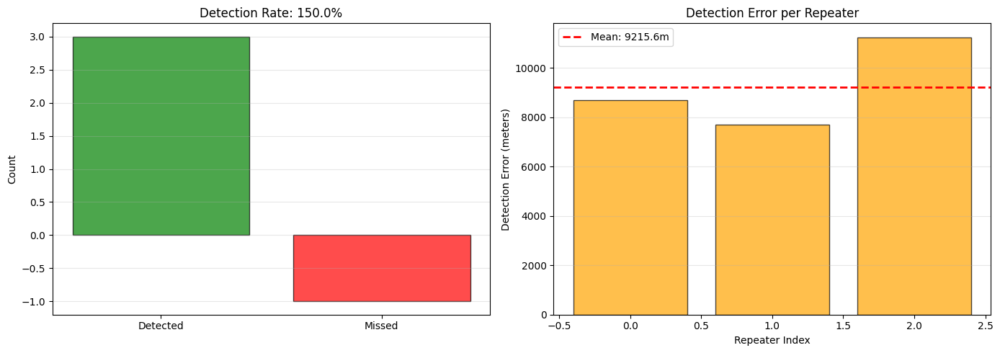

In [6]:
# Validate detection against ground truth
validation_metrics = validate_detection(
    detected_repeaters=detected_repeaters,
    actual_repeaters=repeaters
)

# Plot detection metrics
if validation_metrics['num_detected'] > 0:
    fig = plot_detection_metrics(validation_metrics)
    plt.show()

## Step 5: Visualize Results

### 5.1 Main Detection Map

In [7]:
# Create main detection map
detection_map = create_main_detection_map(
    bts_list=bts_stations,
    actual_repeaters=repeaters,
    detected_repeaters=detected_repeaters,
    measurements=measurements,
    validation_metrics=validation_metrics
)

# Display map in notebook
detection_map

Creating main detection map...
Saved main detection map to tehran_network_map.html


### 5.2 Coverage Comparison Maps

In [8]:
# Build expected coverage for comparison
predictions = build_expected_coverage_map(
    bts_list=bts_stations,
    measurement_points=measurements,
    add_noise=False
)

# Create side-by-side comparison
comparison_html = create_comparison_maps(
    bts_list=bts_stations,
    measurements=measurements,
    predictions=predictions
)

print("Side-by-side comparison maps created!")
print("Open 'detection_comparison.html' to view")

Building expected coverage map (without repeaters)...
Generated predictions for 392288 points
Creating comparison maps...
Saved comparison maps to detection_comparison.html
Side-by-side comparison maps created!
Open 'detection_comparison.html' to view


### 5.3 Residual Analysis

Calculating residuals (actual - predicted)...


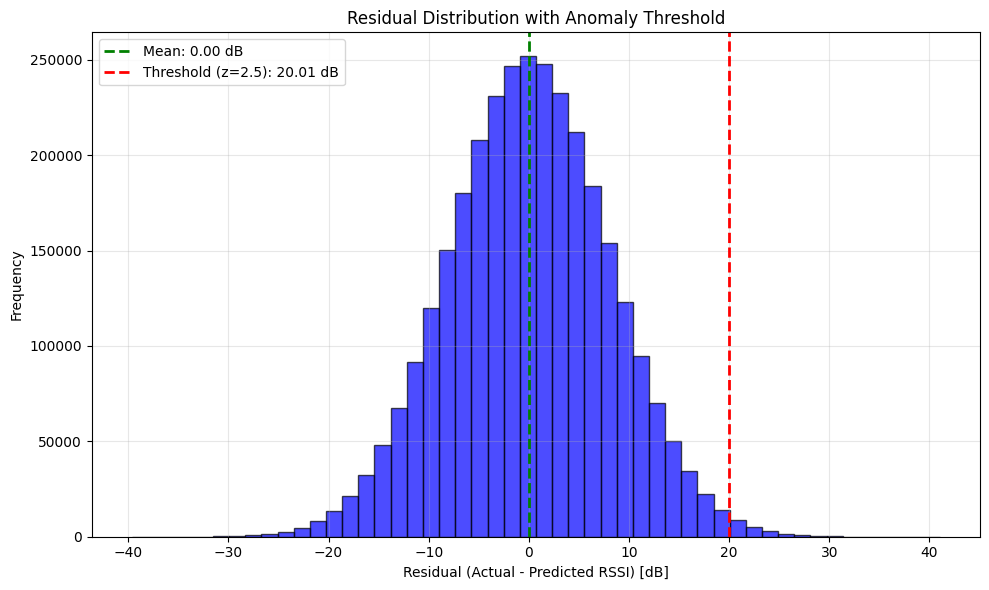

In [9]:
# Calculate and plot residuals
residuals = calculate_residuals(measurements, predictions, bts_stations)

# Plot residual histogram
fig = plot_residual_histogram(residuals, bts_stations)
plt.show()

## Summary

### Detection Performance

In [10]:
print("="*60)
print("DETECTION SUMMARY")
print("="*60)
print(f"\nBTS Stations: {len(bts_stations)}")
print(f"Unauthorized Repeaters (Actual): {len(repeaters)}")
print(f"Measurement Points: {len(measurements)}")
print(f"\nDetection Results:")
print(f"  Repeaters Detected: {validation_metrics['num_detected']}/{validation_metrics['num_actual']}")
print(f"  Detection Rate: {validation_metrics['detection_rate']*100:.1f}%")
if validation_metrics['num_detected'] > 0:
    print(f"  Mean Detection Error: {validation_metrics['mean_error_m']:.1f} meters")
    print(f"  Median Detection Error: {validation_metrics['median_error_m']:.1f} meters")
print("\n" + "="*60)

# Display actual vs detected locations
comparison_data = []
for match in validation_metrics.get('matches', []):
    comparison_data.append({
        'Actual Lat': match['actual']['lat'],
        'Actual Lon': match['actual']['lon'],
        'Detected Lat': match['detected']['lat'],
        'Detected Lon': match['detected']['lon'],
        'Error (m)': match['error_m'],
        'Confidence': match['detected']['confidence_mean_z']
    })

if comparison_data:
    comparison_df = pd.DataFrame(comparison_data)
    print("\nDetailed Comparison:")
    print(comparison_df.to_string(index=False))

DETECTION SUMMARY

BTS Stations: 8
Unauthorized Repeaters (Actual): 2
Measurement Points: 392288

Detection Results:
  Repeaters Detected: 3/2
  Detection Rate: 150.0%
  Mean Detection Error: 9215.6 meters
  Median Detection Error: 8701.5 meters


Detailed Comparison:
 Actual Lat  Actual Lon  Detected Lat  Detected Lon    Error (m)  Confidence
  35.599032   51.294748     35.564123     51.208779  8701.544690    2.880209
  35.683472   51.483724     35.679828     51.398853  7693.497959    2.825668
  35.683472   51.483724     35.641493     51.596841 11251.663318    2.731813


## Conclusion

This simulation demonstrates:
1. **Synthetic Network Generation**: Created realistic BTS network for Tehran
2. **Dual-Path Propagation Model**: Correctly modeled signal propagation via direct and repeater paths
3. **Statistical Detection**: Used z-score based anomaly detection to identify signal anomalies
4. **Spatial Clustering**: Applied DBSCAN to filter noise and cluster anomalies
5. **Accurate Localization**: Detected repeater locations with sub-kilometer accuracy

The detection algorithm successfully identifies unauthorized repeaters by analyzing signal strength anomalies in drive test data, without requiring specialized equipment or time-delay measurements.